Following on from the `variational-simple.ipynb` example (go through that notebook before this one), here we will specify more custom options for the training loop.

## Download GWTC-3 parameter-estimation samples and sensitivty injections

In [1]:
import os

In [2]:
if not os.path.exists('./o1o2o3_mass_c_iid_mag_iid_tilt_powerlaw_redshift_samples.hdf5'):
    if not os.path.exists('./analyses_PowerLawPeak.tar.gz'):
        !wget https://zenodo.org/records/11254021/files/analyses_PowerLawPeak.tar.gz
    !tar -xzvf analyses_PowerLawPeak.tar.gz
    !mv ./analyses/PowerLawPeak/o1o2o3_mass_c_iid_mag_iid_tilt_powerlaw_redshift_samples.hdf5 .
    !rm -r analyses

In [3]:
if not os.path.exists('./o1+o2+o3_bbhpop_real+semianalytic-LIGO-T2100377-v2.hdf5'):
    !wget https://zenodo.org/records/7890398/files/o1+o2+o3_bbhpop_real+semianalytic-LIGO-T2100377-v2.hdf5

In [4]:
ls

analyses_PowerLawPeak.tar.gz
o1+o2+o3_bbhpop_real+semianalytic-LIGO-T2100377-v2.hdf5
o1o2o3_mass_c_iid_mag_iid_tilt_powerlaw_redshift_samples.hdf5
variational-custom.ipynb
variational-numpyro.ipynb
variational-simple.ipynb


## Imports

In [5]:
import numpy as np
import pandas
import h5py
import matplotlib.pyplot as plt
from corner import corner

In [6]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import jax
jax.config.update('jax_enable_x64', True)
import jax.numpy as jnp

import gwpopulation
gwpopulation.set_backend('jax')

In [7]:
jax.devices()

[cuda(id=0)]

## Load the data

In [8]:
def load_posteriors():
    posteriors = []
    
    with h5py.File(
        './o1o2o3_mass_c_iid_mag_iid_tilt_powerlaw_redshift_samples.hdf5', 'r',
    ) as f:

        samples = f['original']
        num_obs, num_samples = samples['a_1'].shape
        
        for n in range(num_obs):
            posterior = pandas.DataFrame()
            for par in samples:
                posterior[par] = samples[par][n, :]

            posteriors.append(posterior)
    
    return posteriors

In [9]:
def load_injections():
    cut_far = 1.0
    cut_snr = 10.0
    
    injections = {}
    
    with h5py.File(
        './o1+o2+o3_bbhpop_real+semianalytic-LIGO-T2100377-v2.hdf5', 'r',
    ) as f:
        samples = f['injections']
    
        ifars = [
            samples[par][:] for par in samples.keys()
            if ('ifar' in par) and ('cwb' not in par)
            ]
        ifar = np.max(ifars, axis=0)
        snr = samples['optimal_snr_net'][:]
        runs = samples['name'][:].astype(str)
        found = np.where(runs == 'o3', ifar > 1/cut_far, snr > cut_snr)
    
        mass_1 = samples['mass1_source'][:][found]
        mass_2 = samples['mass2_source'][:][found]
        spin1x = samples['spin1x'][:][found]
        spin1y = samples['spin1y'][:][found]
        spin1z = samples['spin1z'][:][found]
        spin2x = samples['spin2x'][:][found]
        spin2y = samples['spin2y'][:][found]
        spin2z = samples['spin2z'][:][found]
        redshift = samples['redshift'][:][found]
    
        mass_ratio = mass_2 / mass_1
        a_1 = (spin1x**2 + spin1y**2 + spin1z**2)**.5
        a_2 = (spin2x**2 + spin2y**2 + spin2z**2)**.5
        cos_tilt_1 = spin1z / a_1
        cos_tilt_2 = spin2z / a_2
    
        injections['mass_1'] = mass_1
        injections['mass_ratio'] = mass_ratio
        injections['a_1'] = a_1
        injections['a_2'] = a_2
        injections['cos_tilt_1'] = cos_tilt_1
        injections['cos_tilt_2'] = cos_tilt_2
        injections['redshift'] = redshift
    
        prior = samples['sampling_pdf'][:][found]
        prior *= mass_1 * 4 * np.pi**2 * a_1**2 * a_2**2
        injections['prior'] = prior
    
        dodgy = injections['redshift'] > 1.9
        for par in injections:
            injections[par] = injections[par][~dodgy]
    
        injections['total_generated'] = samples.attrs['total_generated']
    
    for par in injections:
        injections[par] = jnp.array(injections[par])
    
    return injections

In [10]:
posteriors = load_posteriors()
injections = load_injections()

## Define the population model

This is exactly as you normally do with gwpopulation.

In [11]:
from gwpopulation.models.mass import SinglePeakSmoothedMassDistribution
from gwpopulation.models.spin import iid_spin
from gwpopulation.models.redshift import PowerLawRedshift
from gwpopulation.experimental.jax import NonCachingModel

In [12]:
def spin_model(dataset, xi_spin, sigma_spin, alpha_chi, beta_chi):
    amax = 1.0
    return iid_spin(dataset, xi_spin, sigma_spin, amax, alpha_chi, beta_chi)

In [13]:
def make_model():
    models = [
        SinglePeakSmoothedMassDistribution(),
        spin_model,
        PowerLawRedshift(cosmo_model = 'Planck15'),
    ]
    return NonCachingModel(models)

Currently only univariate uniform priors are possible. Below we set the prior bounds on the parameters of the population model.

In [14]:
prior_bounds = dict(
    alpha = [-4, 12],
    beta = [-2, 7],
    mmin = [2, 6.5],
    mmax = [65, 100],
    lam = [0, 1],
    mpp = [20, 50],
    sigpp = [1, 10],
    delta_m = [0, 10],
    lamb = [-6, 6],
    alpha_chi = [1, 10],
    beta_chi = [1, 10],
    xi_spin = [0, 1],
    sigma_spin = [0.1, 4],
)

## Defined the population likelihood

This is exactly as you normally do with gwpopulation.

In [15]:
from gwpopulation.vt import ResamplingVT
from gwpopulation.hyperpe import HyperparameterLikelihood

In [16]:
selection_function = ResamplingVT(
    model = make_model(),
    data = injections,
    n_events = len(posteriors),
    marginalize_uncertainty = False,
    enforce_convergence = False,
)

In [17]:
likelihood = HyperparameterLikelihood(
    posteriors = posteriors,
    hyper_prior = make_model(),
    selection_function = selection_function,
    maximum_uncertainty = jnp.inf,
)

## Custom training loop

Training the variational posterior is easily customizable using features from the [`flowjax`](https://danielward27.github.io/flowjax), [`equinox`](https://docs.kidger.site/equinox), and [`optax`](https://optax.readthedocs.io) packages. In the following we will:
- define a custom flow variational posterior,
- initialize the flow to the uniform prior before training on the population likelihood,
- alter the batch size used to compute the variational loss function,
- use a learning rate schedule,
- define a custom optimization algorithm,
- taper the population likelihood with a differentiable function to avoid regions of parameter space with large Monte Carlo uncertainties,
- temper the non-normalized target density with an annealing temperature schedule,
- customize the progress bar.

Of course, not all of these custom options are necessary, but they illustrate what can be done.

#### Define a flow

We use the `flowjax` library for normalizing flows; see the [documentation](https://danielward27.github.io/flowjax). The support of the flow distribution is unbounded. We can include parameter constrains, e.g., prior bounds, manually with fixed transformations.

In [18]:
from flowjax.distributions import StandardNormal
from flowjax.flows import block_neural_autoregressive_flow

In [19]:
dim = len(prior_bounds)

base_dist = StandardNormal(shape = (dim,))

flow_init = block_neural_autoregressive_flow(
    key = jax.random.PRNGKey(0),
    base_dist = base_dist,
    nn_depth = 1,
    nn_block_dim = 8,
    flow_layers = 1,
    invert = False, # BNAF is not invertible, this MUST be False
)

In [20]:
from gwax.flows import bound_from_unbound

In [21]:
flow_init = bound_from_unbound(flow_init, prior_bounds.values())

Check the bounds are actually enforced. Each dimensions is contrained with a sigmoid bijection which adds a lot of support to the boundaries. This is not a good initialization, so let's choose a better one.

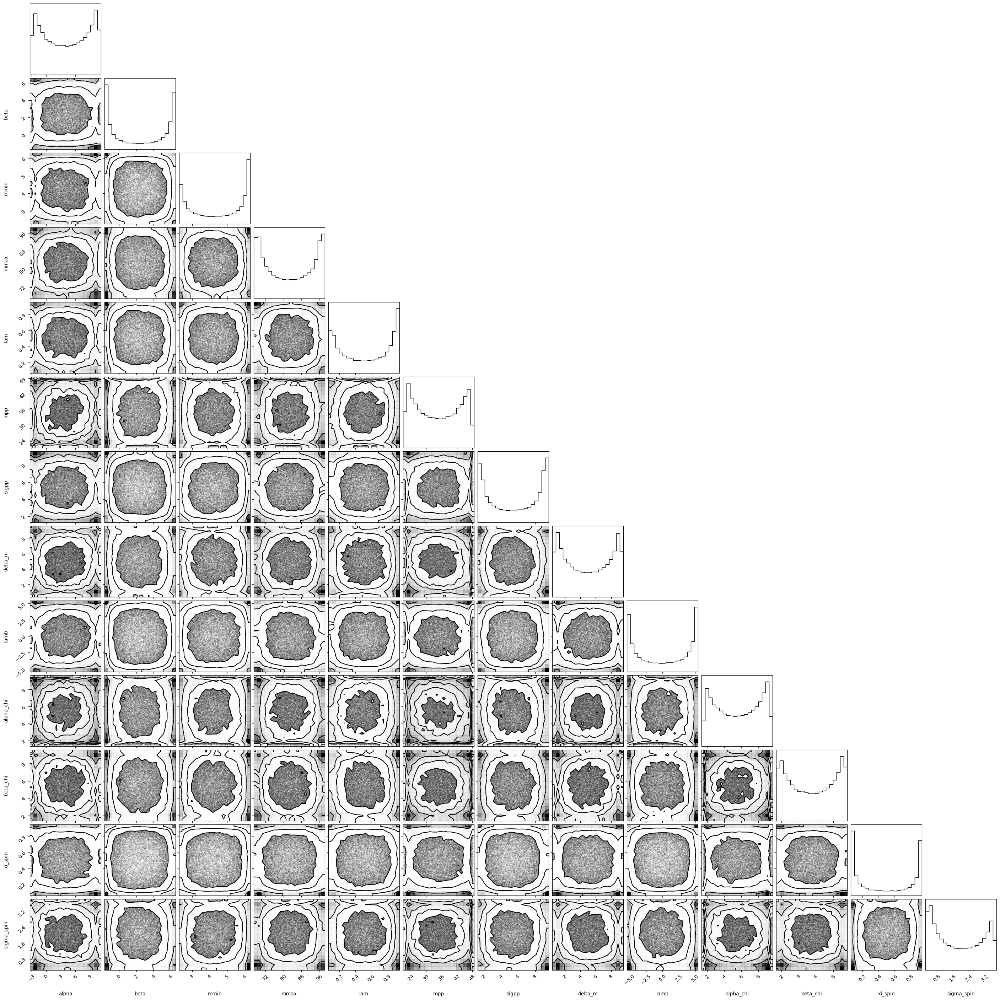

In [22]:
samples = flow_init.sample(jax.random.PRNGKey(1), (100_000,))
corner(np.array(samples), labels = list(prior_bounds));

#### Initialize the variational posterior to the prior

A sensible initialization is to start from the prior. For generic flows this cannot be done manually, but we can train the flow with a flat likelihood. As we do not have to evaluate the likelihood, calculating the loss function is quick, so let's increase the batch size.

In [23]:
from gwax.variational import trainer

In [24]:
flow_prior, losses = trainer(
    key = jax.random.PRNGKey(2),
    prior_bounds = prior_bounds,
    likelihood = None,
    flow = flow_init,
    batch_size = 10_000,
    steps = 1_000,
    learning_rate = 1e-2,
)

  0%|          | 0/1000 [00:00<?, ?it/s]

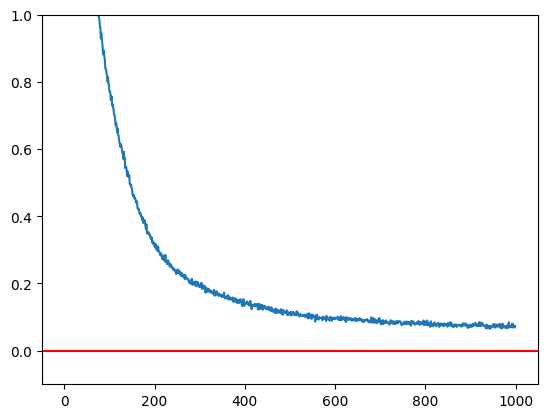

In [25]:
plt.plot(losses)
plt.axhline(0, c = 'r')
plt.ylim(-0.1, 1);

The result doesn't look quite like the uniform prior and we can see above the loss function did not reach the minimum (red line). Let's play with the training dynamics to see if we can improve it.

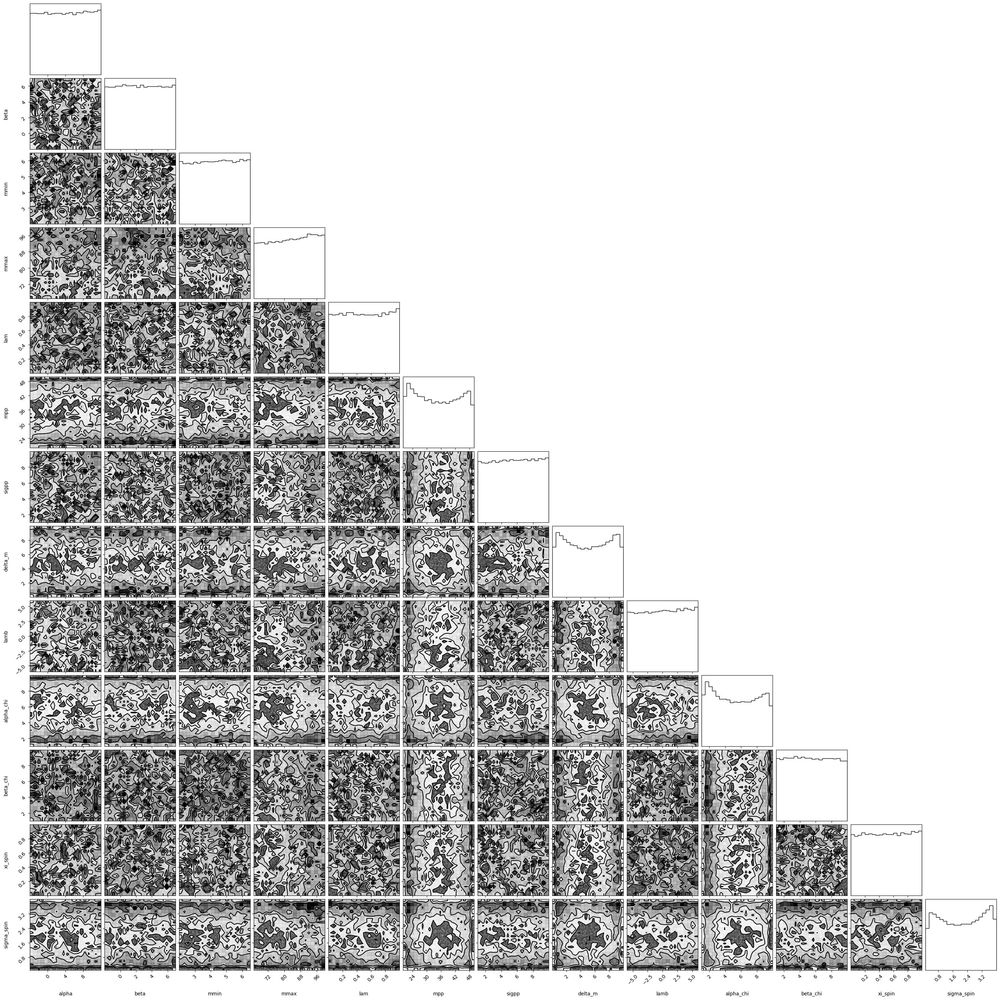

In [26]:
samples = flow_prior.sample(jax.random.PRNGKey(3), (100_000,))
corner(np.array(samples), labels = list(prior_bounds));

#### Learning rate schedule

I empirically found that starting with very a large learning rate and then decaying it was effective and leads to fast convergence. We can implement this easily using `optax`; see the [documentation](https://optax.readthedocs.io).

In [27]:
import optax

In [28]:
# very large constant learning rate for 1,000 steps,
# followed by cosine decay to zero learning rate over 1,000 more steps

init_learning_rate = 1e0
constant_steps = 1_000
total_steps = 2_000

schedules = [
    optax.constant_schedule(value = init_learning_rate),
    optax.cosine_decay_schedule(
        init_value = init_learning_rate,
        decay_steps = total_steps - constant_steps,
        alpha = 0.0,
        exponent = 1.0,
    ),
]

learning_rate = optax.join_schedules(
    schedules = schedules, boundaries = [constant_steps],
)

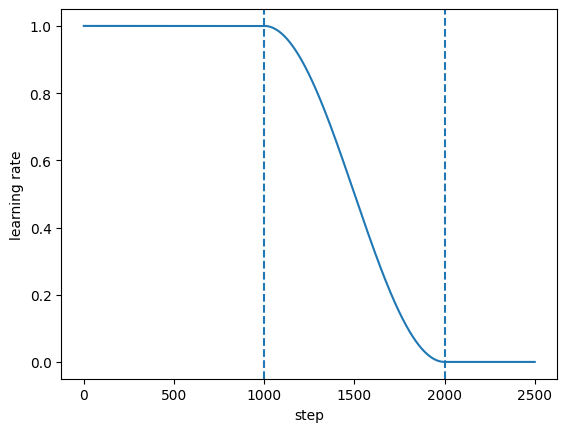

In [29]:
x = jnp.arange(total_steps + 500)
y = learning_rate(x)
plt.plot(x, y)
plt.axvline(constant_steps, ls = '--')
plt.axvline(total_steps, ls = '--')
plt.xlabel('step')
plt.ylabel('learning rate');

In [30]:
flow_prior, losses = trainer(
    key = jax.random.PRNGKey(2), # use the same seed as before
    prior_bounds = prior_bounds,
    likelihood = None,
    flow = flow_init,
    batch_size = 10_000,
    steps = total_steps,
    learning_rate = learning_rate,
    optimizer = optax.adam,
)

  0%|          | 0/2000 [00:00<?, ?it/s]

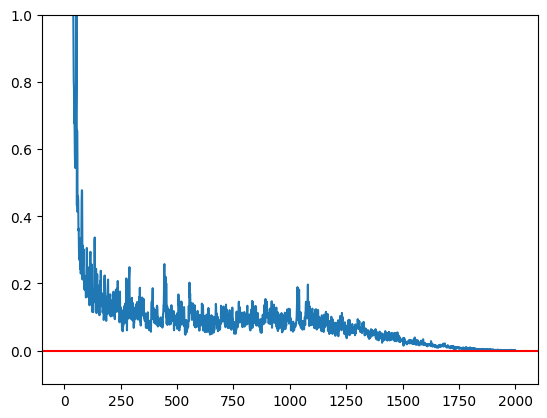

In [31]:
plt.plot(losses)
plt.axhline(0, c = 'r')
plt.ylim(-0.1, 1);

This looks much more uniform:

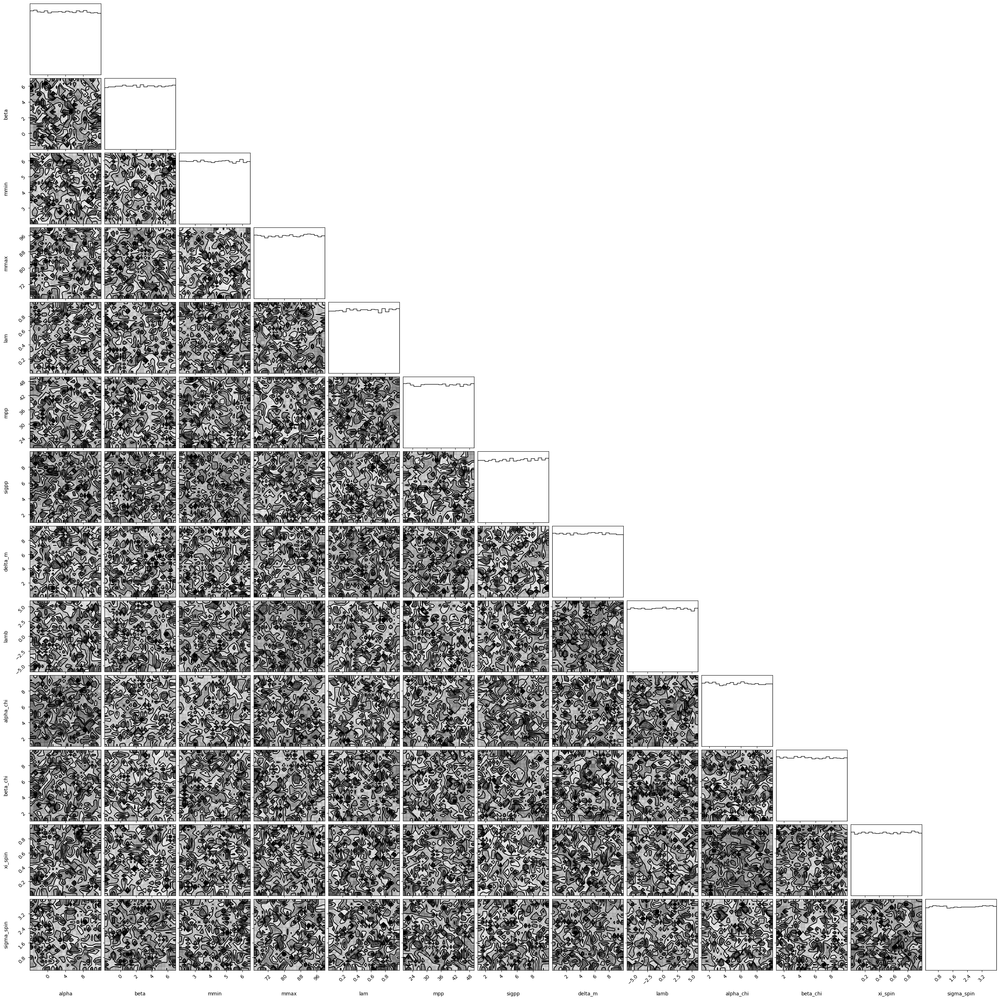

In [32]:
samples = flow_prior.sample(jax.random.PRNGKey(3), (100_000,)) # same seed
corner(np.array(samples), labels = list(prior_bounds));

#### Tapered likelihood

Now let's get back to learning the posterior. The gravitational-wave population likelihood computed in `gwpopulation` uses Monte Carlo estimators for several integrals, producing a biased estimate of the log-likelihood. This approximation carries inherent statistical uncertainty.

We can modify the likelihood ad hoc to vanish for parameters that result in large uncertaintes. We must ensure the likelihood remains differentiable with respect to the trainable parameters of the variational posterior, however. To do this, we can defined a custom tapering function.

In [33]:
max_variance = 1.0

# taper is additive to the log-likelihood
# likelihood multiplied by steep sigmoid decay to zero for variances > 1
taper = lambda variance: jax.nn.log_sigmoid(1e2 * (max_variance - variance))

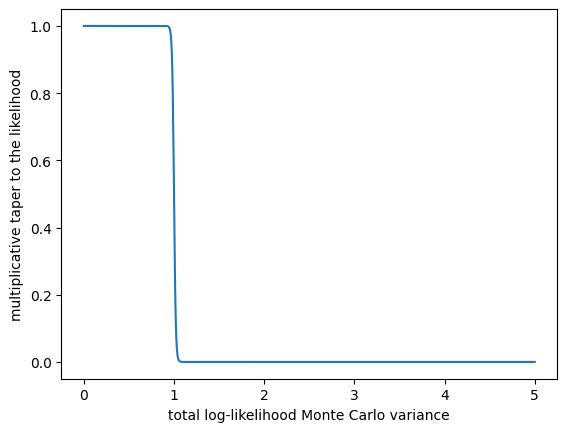

In [34]:
x = jnp.linspace(0, 5, 1_000)
y = jnp.exp(taper(x))
plt.plot(x, y)
plt.xlabel('total log-likelihood Monte Carlo variance')
plt.ylabel('multiplicative taper to the likelihood');

#### Annealed posterior tempering

Tempering is a technique used to make posteriors that are difficult to sample from more tractable. The posterior $p \propto \pi \mathcal{L}$ is replaced by $(\pi \mathcal{L})^\tau$, where $\pi$ is the prior, $\mathcal{L}$ the likelihood, and $T=1/\tau$ is often called the temperature. The exponent acts to disperse the support of the posterior, which can be especially useful for multimodal targets.

During annealed tempering the temperature is varied during the course of inference, such that the tempered posterior becomes closer to the true one.

We can implement a schedule for the inverse temperature $\tau=1/T$ as an illustration of how to implement custom scheules. As tempering is not actually necessary for this example, we'll implement a constant schedule:

In [35]:
def constant_schedule(value):
    return lambda step: value

In [36]:
temper_schedule = constant_schedule(1.0)

#### Progress bar options

Finally, we can specify custom progress bar options, which uses [`jax-tqdm`](https://github.com/jeremiecoullon/jax-tqdm). The options should be passed in a dictionary to the the `tqdm_args` option, which can include any of the options for [`tqdm`](https://tqdm.github.io); see the [documentation](https://tqdm.github.io/docs/tqdm/#tqdm-objects). Additionally, [`jax-tqdm`](https://github.com/jeremiecoullon/jax-tqdm) takes two arguments: `print_rate`, that specifies after how many steps to update the progress bar; and `tqdm_type`, which can be `'std'`, `'notebook'`, or `'auto'`, corresponding to the `tqdm` submodules.

In [37]:
tqdm_args = dict(
    print_rate = 1,
    tqdm_type = 'std',
    desc = 'variational inference training',
)

#### Train the posterior

While we're at it, let's use a custom optimizer too. `optax` is extremely flexible so you can get wild with this, but for this example let's keep it simple.

By default the `trainer` function uses the Adam optimizer, which we'll also do here, but this shows how to specific a different algorithm if you wanted to. Then let's also add some gradient clipping to make sure training is stable. This demonstrates how gradient updates can be chained together.

In [38]:
init_learning_rate = 1e-1
constant_steps = 1_000
total_steps = 2_000

schedules = [
    optax.constant_schedule(value = init_learning_rate),
    optax.cosine_decay_schedule(
        init_value = init_learning_rate,
        decay_steps = total_steps - constant_steps,
        alpha = 0.0,
        exponent = 1.0,
    ),
]

learning_rate = optax.join_schedules(
    schedules = schedules, boundaries = [constant_steps],
)

optimizer = optax.chain(
    optax.clip_by_global_norm(1.0),
    optax.adam(learning_rate),
)

Most of the above is not necessary, but it demonstrates how you can specify custom behaviour. Now let's finally get back to learning the population posterior. Combine all these ingredients together:

In [39]:
import time

In [40]:
t0 = time.time()

flow, losses = trainer(
    key = jax.random.PRNGKey(4),
    prior_bounds = prior_bounds,
    likelihood = likelihood,
    flow = flow_prior, # initialize training from the learned prior
    batch_size = 10, # use larger batch size than default of 1
    steps = total_steps,
    # when using an instance of optax.gradientTransformation(...) for optimizer,
    # learing_rate has no effect
    learning_rate = None,
    optimizer = optimizer,
    taper = taper,
    temper_schedule = temper_schedule,
    tqdm_args = tqdm_args,
)

dt = time.time() - t0

2024-07-30 12:15:08.063948: E external/xla/xla/service/slow_operation_alarm.cc:65] 
********************************
[Compiling module jit_scan] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2024-07-30 12:15:28.335496: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 2m20.272505141s

********************************
[Compiling module jit_scan] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
variational inference training: 100%|███████████████████████████| 2000/2000 [00:46<00:00, 42.68it/s]


In [41]:
# this time will depend on what GPU you use
print(
    f'We just did population inference in {dt:.1f} seconds, '
    'including JIT compilation',
)

We just did population inference in 346.9 seconds, including JIT compilation


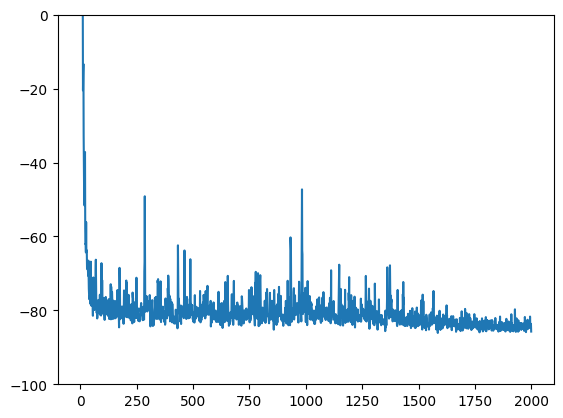

In [42]:
plt.plot(losses)
plt.ylim(-100, 0);

Let's also train a flow without any taper for comparison:

In [ ]:
flow_notaper, losses = trainer(
    key = jax.random.PRNGKey(5),
    prior_bounds = prior_bounds,
    likelihood = likelihood,
    flow = flow_prior, # initialize training from the learned prior
    batch_size = 10, # use larger batch size than default of 1
    steps = total_steps,
    # when using an instance of optax.gradientTransformation(...) for optimizer,
    # learing_rate has no effect
    learning_rate = None,
    optimizer = optimizer,
    taper = None,
    temper_schedule = None,
    tqdm_args = tqdm_args,
)

  0%|                                                                      | 0/2000 [00:00<?, ?it/s]

In [ ]:
fig = None
for i, f in enumerate((flow_notaper, flow)):
    samples = f.sample(jax.random.PRNGKey(6), (10_000,))
    color = plt.get_cmap('tab10')(i)
    fig = corner(
        np.array(samples),
        labels = list(prior_bounds),
        fig = fig,
        plot_datapoints = False,
        plot_density = False,
        plot_contours = True,
        fill_contours = False,
        no_fill_contours = True,
        hist_kwargs = dict(density = True, color = color),
        contour_kwargs = dict(colors = [color]),
    )

handles = fig.axes[0].patches
labels = 'no taper', 'tapered'
fig.axes[1].legend(handles, labels, loc = 'upper left', fontsize = 30);

## Importance sampling

Our original likelihood imposed no cut on the total Monte Carlo variance, which we instead approximated with a very steep but smooth taper. We now define a new likelihood with a hard cut and reweight to that likelihood.

In [ ]:
from gwax.variational import importance

In [ ]:
new_likelihood = HyperparameterLikelihood(
    posteriors = posteriors,
    hyper_prior = make_model(),
    selection_function = selection_function,
    maximum_uncertainty = max_variance ** 0.5,
)

In [ ]:
stats = importance(
    key = jax.random.PRNGKey(7),
    prior_bounds = prior_bounds,
    likelihood = new_likelihood,
    flow = flow,
    batch_size = 10_000,
)

In [ ]:
stats.keys()

The importance sampling efficiency is much higher than it would have been had we not included a tapering function to modify the likelihood:

In [ ]:
fig = None
for i, weights in enumerate((None, stats['weights'])):
    color = plt.get_cmap('tab10')(i)
    fig = corner(
        np.array(stats['samples']),
        weights = weights,
        labels = list(prior_bounds),
        fig = fig,
        plot_datapoints = False,
        plot_density = False,
        plot_contours = True,
        fill_contours = False,
        no_fill_contours = True,
        hist_kwargs = dict(density = True, color = color),
        contour_kwargs = dict(colors = [color]),
    )

handles = fig.axes[0].patches
labels = 'tapered', 'tapered importance reweighted'
fig.axes[1].legend(handles, labels, loc = 'upper left', fontsize = 30);

In [ ]:
print('likelihood with taper:')
print(
    f"log(evidence) = {stats['log_evidence']} "
    f"+/- {stats['log_evidence_variance'] ** 0.5}"
)
print(f"sample efficiency = {stats['efficiency'] * 100} %")

In [ ]:
stats_notaper = importance(
    key = jax.random.PRNGKey(8),
    prior_bounds = prior_bounds,
    likelihood = new_likelihood,
    flow = flow_notaper,
    batch_size = 10_000,
)

print('likelihood without taper:')
print(
    f"log(evidence) = {stats_notaper['log_evidence']} "
    f"+/- {stats_notaper['log_evidence_variance'] ** 0.5}"
)
print(f"sample efficiency = {stats_notaper['efficiency'] * 100} %")

We can also see that the tapered likelihood was pretty effective in avoiding variances larger than the imposed maximum:

In [ ]:
from gwax.variational import likelihood_extras
from functools import partial

In [ ]:
parameters = dict(zip(prior_bounds, stats['samples'].T))
extras = jax.lax.map(partial(likelihood_extras, likelihood), parameters)

In [ ]:
extras.keys()

In [ ]:
print('likelihood with taper:')
print(
    f"{np.mean(extras['variance'] < max_variance) * 100} % of samples "
    f"have variance < {max_variance}"
)

In [ ]:
parameters = dict(zip(prior_bounds, stats_notaper['samples'].T))
extras_notaper = jax.lax.map(partial(likelihood_extras, likelihood), parameters)

print('likelihood without taper:')
print(
    f"{np.mean(extras_notaper['variance'] < max_variance) * 100} % of samples "
    f"have variance < {max_variance}"
)

## Importance weighted predictive population

In [ ]:
m1 = jnp.linspace(2, 100, 1_000)
m1_model = SinglePeakSmoothedMassDistribution()
m1_pdf = lambda parameters: m1_model.p_m1(
    dataset = dict(mass_1 = m1),
    alpha = parameters['alpha'],
    mmin = parameters['mmin'],
    mmax = parameters['mmax'],
    lam = parameters['lam'],
    mpp = parameters['mpp'],
    sigpp = parameters['sigpp'],
)

In [ ]:
# weight each PDF draw

parameters = dict(zip(prior_bounds, stats_notaper['samples'].T))
pdfs_notaper = jax.vmap(m1_pdf)(parameters)

parameters = dict(zip(prior_bounds, stats['samples'].T))
pdfs = jax.vmap(m1_pdf)(parameters)

for i, (ps, weights) in enumerate(zip(
    (pdfs_notaper, pdfs, pdfs), (None, None, stats['weights']),
)):
    color = plt.get_cmap('tab10')(i)
    plt.plot(
        m1,
        np.quantile(
            ps,
            (0.05, 0.5, 0.95),
            weights = weights,
            method = 'inverted_cdf',
            axis = 0,
        ).T,
        c = color,
    )

handles = plt.gca().lines[0], plt.gca().lines[3], plt.gca().lines[6]
labels = 'no taper', 'tapered', 'tapered importance reweighted'
plt.legend(handles, labels, loc = 'upper right')

plt.semilogy()
plt.ylim(1e-5, 1e0)
plt.xlabel('$m_1$')
plt.ylabel('$p(m_1)$');

In [ ]:
# resample the unweighted samples according to the importance weights
# this should be equivalent to the above

pdfs_resample = jax.random.choice(
    jax.random.PRNGKey(9),
    pdfs,
    shape = pdfs.shape[:-1],
    p = stats['weights'],
    replace = True,
    axis = 0,
)

for i, ps in enumerate([pdfs_notaper, pdfs, pdfs_resample]):
    color = plt.get_cmap('tab10')(i)
    plt.plot(m1, np.quantile(ps, (0.05, 0.5, 0.95), axis = 0).T, c = color)

handles = plt.gca().lines[0], plt.gca().lines[3], plt.gca().lines[6]
labels = 'no taper', 'tapered', 'tapered importance reweighted'
plt.legend(handles, labels, loc = 'upper right')

plt.semilogy()
plt.ylim(1e-5, 1e0)
plt.xlabel('$m_1$')
plt.ylabel('$p(m_1)$');